<a href="https://colab.research.google.com/github/davidkant/mai-demo/blob/master/2_sunSurgeAutomata.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# *sunSurgeAutomata*
In composer and computer scientist Carla Scalettie' 1987 piece *sunSurgeAutomata*, all of the sounds are derived using one-dimensional cellular automata. Let's see if we can reproduce some of them!

* Listen to [sunSurgeAutomata](https://carlascaletti.com/sunsurgeautomata/)
* Read Scaletti's [Mu spi manifesto](https://carlascaletti.com/)

## Setup
Install external libraries and import them into your notebook session.

In [0]:
# install external libraries for sound playback
from IPython.display import clear_output
!pip install -q git+https://github.com/davidkant/mai#egg=mai;
!apt-get -qq update
!apt-get -qq install -y libfluidsynth1
clear_output()

In [0]:
import mai
from mai import ca

In [0]:
def pretty_print(ca):
  for gen in ca:
    print(gen)

## Let's generate a CA
The **rules** determines which cells live and die from one generation to the next.

Generate a 1d CA using rule 90.

In [0]:
# rule 90
rule = [0,1,0,1,1,0,1,0]

# generate the CA
my_ca = ca.generate(rule, size=31, iters=15)

Visualize it.

In [19]:
# animation
ca.animate_1d(my_ca)

## Different rule, different pattern
Different rules generate different emergent patterns! It's not so easy to predict...



In [20]:
# rule
rule = [0,0,0,1,1,1,1,0]

# generate and plot
my_ca = ca.generate(rule, size=31, iters=15)
ca.animate_1d(my_ca)

We can also visualize the evolution over time. Time is represented from top to bottom.

In [21]:
# 2d animation
ca.animate_1d2d(my_ca)

## How is the CA represented as numbers?

In [22]:
pretty_print(my_ca)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1,

## But how is that *sound*?
Now how would you turn that into sound?!?! ... Scaletti uses three different strategies:

  1. To generate rhythmic pattern of clicks
  2. As gates on a recording of Scaletti’s voice
  3. Applied to a stream of samples like a filter


Let's try 1. for now, and treat the CA as a squence of "clicks".

In [0]:
# rule 90
rule = [0,1,0,1,1,0,1,0]

# generate the CA
my_ca = ca.generate(rule, size=31, iters=15)

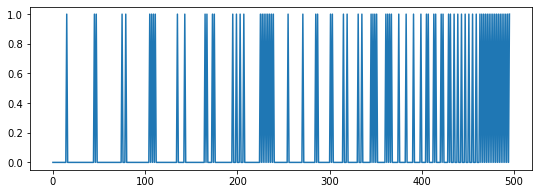

In [24]:
# plot waveform
ca.plot_waveform(my_ca)

# listen waveform
ca.synth_waveform(my_ca, stride=5000)

Try adjusting the argument `stride=`. What happens?

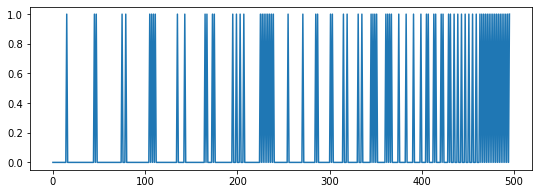

In [25]:
# plot waveform
ca.plot_waveform(my_ca)

# listen waveform
ca.synth_waveform(my_ca, stride=50)

## "Sonification ≠ Music"

*Sonification* is the mapping of abstract data into sound. But *how* you map data to sound can have more to do with the resulting sound than the data itself. Any sonification is just one way of hearing that data, one of many...


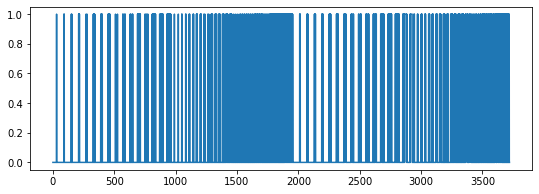

In [26]:
# rule 90
rule = [0,1,0,1,1,0,1,0]
# rule = [0,0,0,1,1,1,1,0]

# generate the CA
my_ca = ca.generate(rule, size=60, iters=60)

# plot waveform
ca.plot_waveform(my_ca)

# listen waveform
ca.synth_waveform(my_ca, stride=50)

## iFFT synthesize
Scaletti's CA interpreted as a spectrogram using `iFFT` synthesis.

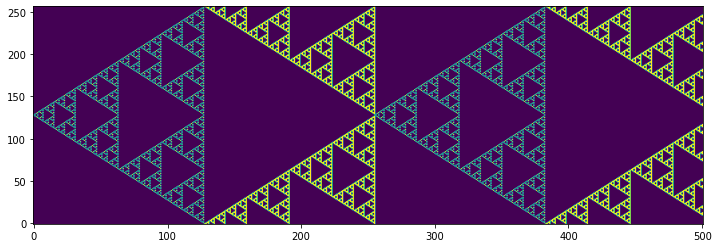

In [27]:
# rule 90
rule = [0,1,0,1,1,0,1,0]

# generate CA
rows = mai.ca.generate(rule, size=257, iters=500)

# plot iFFT
mai.ca.plot_iFFT(rows)

# list iFFT
mai.ca.synth_iFFT(rows, stride=30)